# Analysis for Task 3 and 5 

In [1]:
import polars as pl
import pandas as pd
import pymc as pm
import arviz as az
import arviz_plots as azp
az.style.use("arviz-docgrid")
from plotnine import * 

In [40]:
from utils import pp_check_dens_overlay, pp_check_pit_ecdf, pp_check_ecdf_overlay

:::{.callout-caution}
# Note to future self 

`arviz` is going through some refactoring changes ... which is why we're also using [`arviz-plots`](https://github.com/arviz-devs/arviz-plots) ([documentations](https://python.arviz.org/projects/plots/en/latest/)), but might want to eventually write our own plotting functions instead ... 
:::

In [2]:
# read in data 
task5_df = pl.read_csv("../../data/processed/task5.csv")
task3_df = pl.read_csv("../../data/processed/task3.csv")

## Task 5 -- Error on X-Axis 

We want to implement the following model in PyMC: 

$$
\begin{align}
\texttt{x\_error}_i &\sim \mathcal{N}(\mu_{\text{PID}[i]}, \sigma_{i, \text{PID}[i]}) \\ 
\mu_j &\sim \mathcal{N}(\overline{\mu}, \overline{\sigma}^2)\\ 
\log(\sigma_{i, j}) &= \alpha_j + \log(\texttt{va.ans.y}_i) \\ 
\alpha_j &\sim N(\mu_\alpha, \sigma_\alpha) \\ 
\mu_\alpha, \bar{\mu} &\sim N(0, 1) \\ 
\sigma_\alpha, \bar{\sigma} &\sim \text{Half-Cauchy}(\mu=0, \beta=1)
\end{align}
$$

- [`pymc.HalfCauchy`](https://www.pymc.io/projects/docs/en/latest/api/distributions/generated/pymc.HalfCauchy.html) --- note that this is the **standard half-cauchy** distribution (i.e., distribution starts at 0 and extends to $+\infty$ and NOT a shifted cauchy distribution). For our case we simply don't need to specify $mu = 0$. 

In [7]:
# prepare data 
# first filter out those data that we will NOT use to fit the model
# task 5 excludes analysis from two participants who were using the slider in a wrong way ... 
task5_x_exclude = ["667433338e6cc9e53c828774", "67e2f5ebbe69a58c40a5d550"]
task5_df = task5_df.filter(~pl.col('participantId').is_in(task5_x_exclude))
va_dist = task5_df.select("va.ans.y").to_numpy().flatten()
obv_error = (task5_df.select("va.select.x") - task5_df.select("va.ans.x")).to_numpy().flatten()

In [8]:
# create participant index mapping (for hierarchical modeling)
participant_ids = task5_df.select("participantId").to_numpy().flatten()
participant_idx, unique_participants = pd.factorize(participant_ids)

In [9]:
with pm.Model(coords={
    "participant": unique_participants
}) as task_5_x_model: 
    # hyperpriors 
    mu_bar = pm.Normal("mu_bar", 0, 1)
    mu_alpha = pm.Normal("mu_alpha", 0, 1)
    sigma_bar = pm.HalfCauchy("sigma_bar", 1)
    sigma_alpha = pm.HalfCauchy("sigma_alpha", 1)

    # data 
    va = pm.Data("va_dist", va_dist)
    participant_idx_data = pm.Data("participant_idx", participant_idx)

    # participant-level intercept 
    alpha_offset = pm.Normal("alpha_offset", 0, 1, dims="participant")
    alpha = pm.Deterministic("alpha", mu_alpha + alpha_offset * sigma_alpha, dims="participant")
    log_sigma = alpha[participant_idx_data] + pm.math.log(va)
    sigma = pm.math.exp(log_sigma)

    mu = pm.Normal("mu", mu_bar, sigma_bar, dims="participant")

    # likelihood 
    error = pm.Normal("error", mu[participant_idx_data], sigma, observed=obv_error)


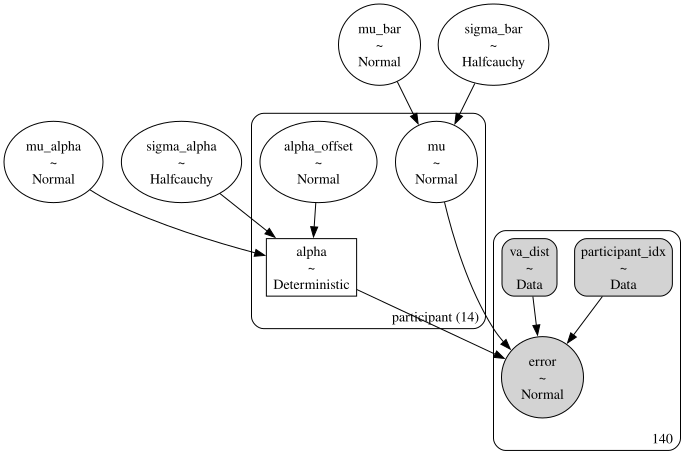

In [10]:
pm.model_to_graphviz(task_5_x_model)

In [12]:
# fit the model 
with task_5_x_model:
    task5_idata = pm.sample(
        draws=3000,
        tune=3000,
        chains=4,
        cores=4,
        target_accept=0.95,
        # random_seed=42, 
        progressbar=True
    )

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu_bar, mu_alpha, sigma_bar, sigma_alpha, alpha_offset, mu]


                                                                                
                              Step      Grad      Sampli…                       
  Progre…   Draws   Diverg…   size      evals     Speed     Elapsed   Remaini…  
 ────────────────────────────────────────────────────────────────────────────── 
  ━━━━━━━   0       0         0.000     0         0.00      0:00:00   -:--:--   
                                                  draws/s                       
  ━━━━━━━   0       0         0.000     0         0.00      0:00:00   -:--:--   
                                                  draws/s                       
  ━━━━━━━   0       0         0.000     0         0.00      0:00:00   -:--:--   
                                                  draws/s                       
  ━━━━━━━   0       0         0.000     0         0.00      0:00:00   -:--:--   
                                                  draws/s                       
                            

Sampling 4 chains for 3_000 tune and 3_000 draw iterations (12_000 + 12_000 draws total) took 6 seconds.


In [15]:
# posterior predictive check 
with task_5_x_model:
    task5_idata = pm.sample_posterior_predictive(task5_idata, extend_inferencedata=True)

Sampling: [error]


Sampling ... ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100% 0:00:00 / 0:00:005;237m━━━━━━━━  80% 0:00:01 / 0:00:00


In [16]:
# read this instead if we don't want to fit 
# task5_idata = az.from_netcdf("../fitted_models/task5.x.nc")
task5_idata

Inference data with groups:
	> posterior
	> posterior_predictive
	> sample_stats
	> observed_data
	> constant_data

In [17]:
az.summary(task5_idata, stat_focus="median")

,median,mad,eti_3%,eti_97%,mcse_median,ess_median,ess_tail,r_hat
mu_bar,0.021,0.007,-0.001,0.043,0.000,12481.358,7284.0,1.0
mu_alpha,-4.356,0.078,-4.578,-4.105,0.002,5657.171,5164.0,1.0
alpha_offset[67f03733938aa3f0d17ce8a8],0.443,0.412,-0.601,1.736,0.009,9519.081,7884.0,1.0
alpha_offset[5c8f2ac8d7ecab0018d529aa],-0.755,0.442,-1.987,0.578,0.008,10885.576,8174.0,1.0
alpha_offset[6740e1e09ca406ab781318cb],-0.094,0.422,-1.237,1.151,0.007,10486.067,8514.0,1.0
alpha_offset[67e557aa25a43e8dde6c806c],-0.834,0.442,-2.067,0.489,0.008,10676.752,7413.0,1.0
alpha_offset[67f441842da280dba751a76b],-0.136,0.418,-1.260,1.185,0.010,10074.813,8763.0,1.0
alpha_offset[67f9736009c0ccdd5034f448],1.446,0.424,0.378,2.780,0.009,8297.356,7995.0,1.0
alpha_offset[67fbed03e8c70e38014c41b3],-0.875,0.444,-2.109,0.433,0.007,10456.863,8666.0,1.0
alpha_offset[558d8d71fdf99b534f79b352],0.461,0.397,-0.587,1.686,0.009,8663.439,7790.0,1.0


array([[<Axes: title={'center': 'mu_bar'}>,
        <Axes: title={'center': 'mu_bar'}>],
       [<Axes: title={'center': 'mu_alpha'}>,
        <Axes: title={'center': 'mu_alpha'}>],
       [<Axes: title={'center': 'alpha_offset'}>,
        <Axes: title={'center': 'alpha_offset'}>],
       [<Axes: title={'center': 'mu'}>, <Axes: title={'center': 'mu'}>],
       [<Axes: title={'center': 'sigma_bar'}>,
        <Axes: title={'center': 'sigma_bar'}>],
       [<Axes: title={'center': 'sigma_alpha'}>,
        <Axes: title={'center': 'sigma_alpha'}>],
       [<Axes: title={'center': 'alpha'}>, <Axes: title={'center': 'alpha'}>]],
      dtype=object)

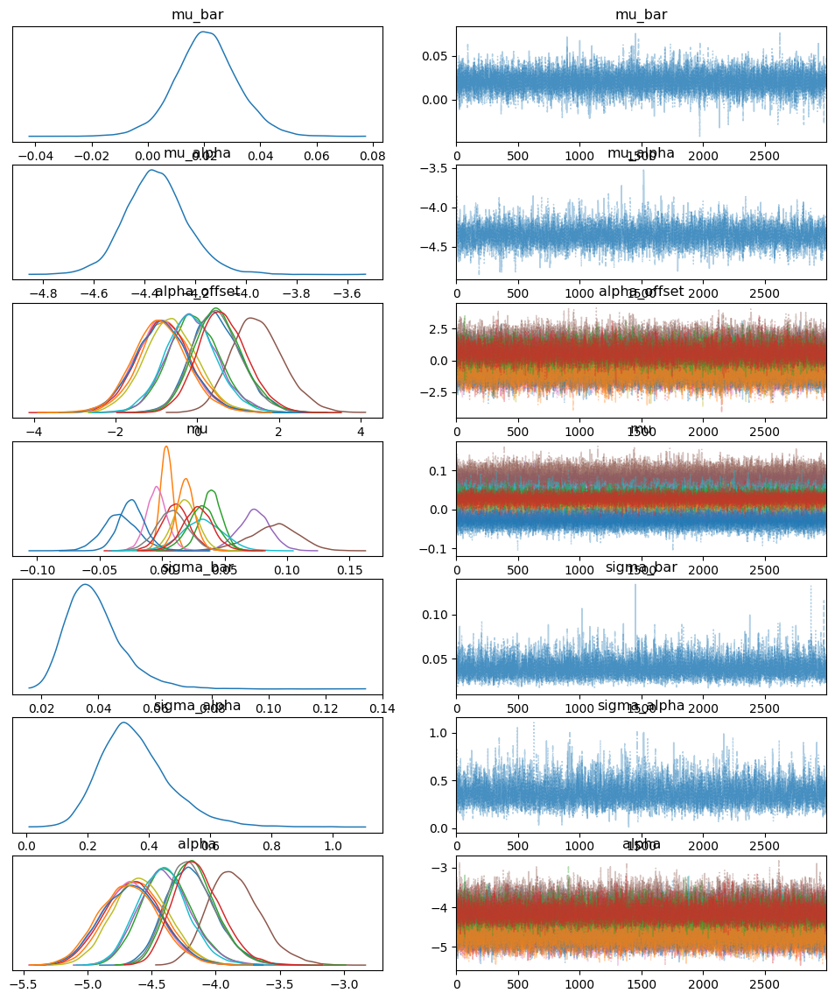

In [18]:
az.plot_trace(task5_idata, combined=True)

array([<Axes: title={'center': '94.0% HDI'}>], dtype=object)

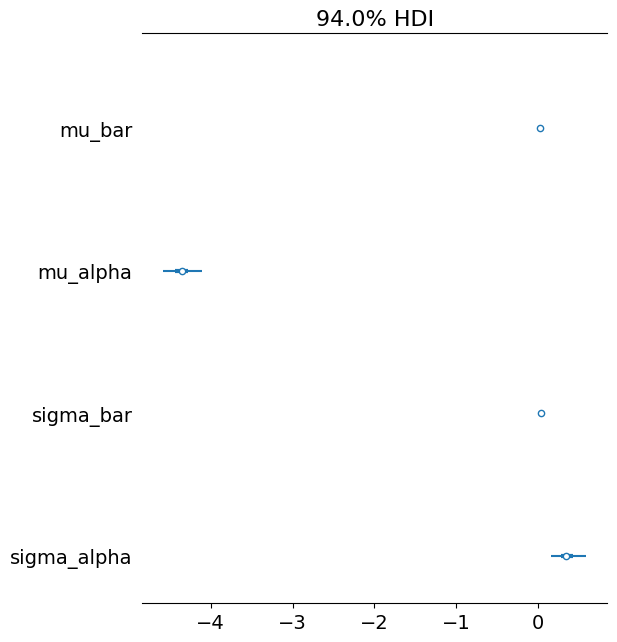

In [19]:
az.plot_forest(task5_idata, combined=True, var_names=["mu_bar", "mu_alpha", "sigma_bar", "sigma_alpha"])

### Posterior predictive check --- arviz default 

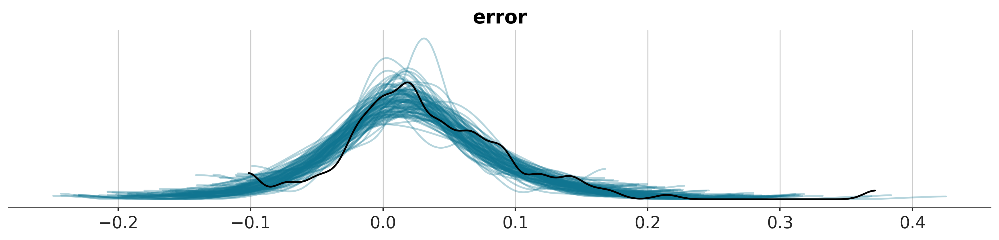

In [23]:
azp.plot_ppc_dist(
    task5_idata,
    num_samples=100
)

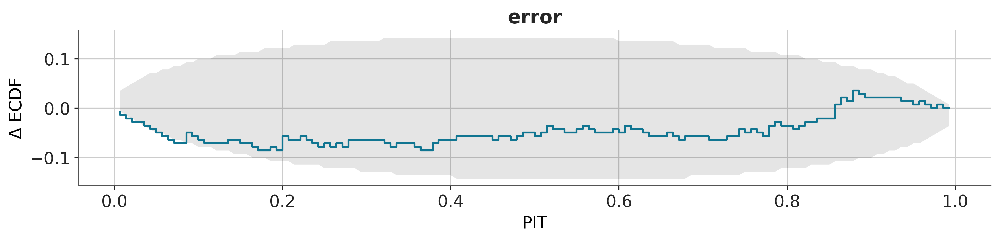

In [25]:
azp.plot_ppc_pit(
    task5_idata,
)

### Posterior predictive check --- custom 

In [ ]:
# optional: directly read from netcdf instead of fitting 
task5_idata = az.from_netcdf("../fitted_models/task5.x.nc")
task5_idata

Inference data with groups:
	> posterior
	> posterior_predictive
	> sample_stats
	> observed_data
	> constant_data

In [21]:
task5_idata.posterior_predictive['error'].values

array([[[ 0.06542839,  0.02010292, -0.07471228, ..., -0.0486206 ,
          0.02390819,  0.01448853],
        [ 0.00574549, -0.02394977, -0.02298007, ..., -0.02332821,
         -0.00688387,  0.04596708],
        [-0.10043093, -0.08914058, -0.14646355, ..., -0.07160649,
         -0.07895485,  0.04808748],
        ...,
        [ 0.0110859 , -0.05444509, -0.05981106, ..., -0.06651605,
          0.02156315,  0.0428099 ],
        [-0.07563741, -0.00537664, -0.03959807, ..., -0.01499502,
         -0.06301857,  0.03773559],
        [ 0.01369594, -0.05668224,  0.00386653, ...,  0.03141857,
         -0.05242851,  0.00406003]],

       [[-0.02194385, -0.0593036 , -0.04249665, ..., -0.04806141,
          0.10897831,  0.04563772],
        [-0.00628182,  0.00165427, -0.02934805, ...,  0.14191065,
          0.04857671,  0.00648586],
        [-0.04565406, -0.06187597,  0.13920393, ...,  0.14780741,
         -0.00226235,  0.03345209],
        ...,
        [-0.01905179,  0.04548075,  0.03482606, ..., -

In [ ]:
# def pp_check_dens_overlay(idata, num_samples = 100, rug_on = False):
#     df_ppc = az.extract(idata, group="posterior_predictive", num_samples=num_samples).to_dataframe().reset_index()
#     df_ppc['.group'] = df_ppc['chain'].astype(str) + "_" + df_ppc['draw'].astype(str)
#     # print(df_ppc)
#     df_og = idata.observed_data.to_dataframe().reset_index()
#     p = (
#         ggplot() + 
#         geom_density(data = df_ppc, mapping=aes(x='error', group=".group"), color="lightblue", alpha=0.5, size=0.25) + 
#         geom_density(data = df_og, mapping=aes(x = 'error'), color="darkblue", size=1) + 
#         theme_minimal() + 
#         labs(y = "") + 
#         theme(
#             axis_text_y=element_blank(),  # Removes the numbers (0.0, 0.2, etc.)
#             axis_ticks_y=element_blank(), # Removes the little tick marks
#             panel_grid_minor_y=element_blank(), # Optional: removes minor grid lines
#             panel_grid_major_y=element_blank()  # Optional: removes major grid lines
#         )
#     )
#     if rug_on: 
#         p = (p + geom_rug(data = df_og, mapping=aes(x = 'error'), alpha = 0.5))
#     return p 

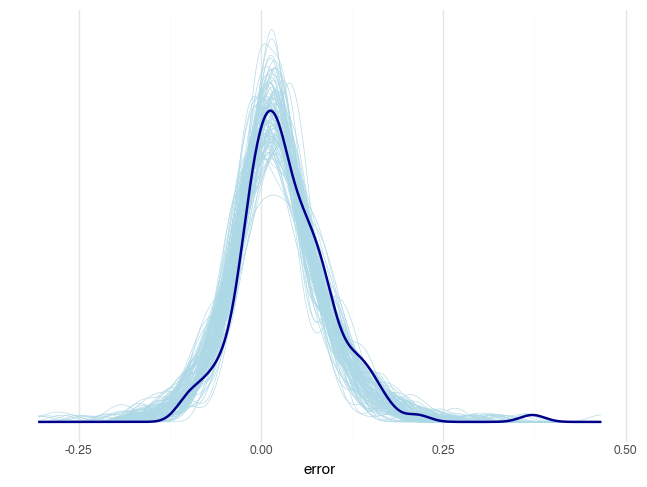

In [22]:
pp_check_dens_overlay(task5_idata)

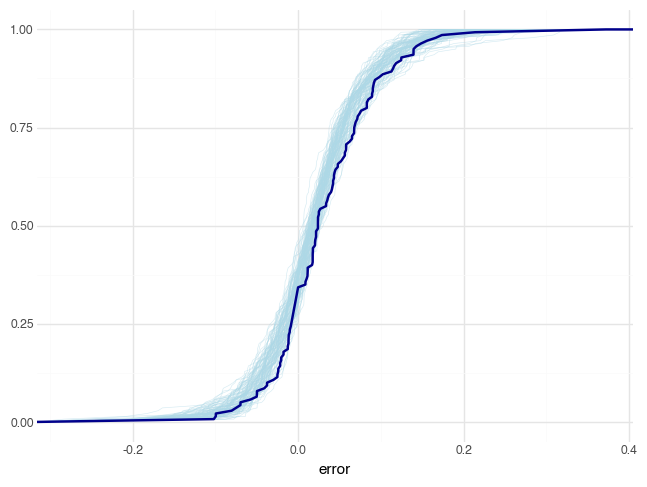

In [23]:
pp_check_ecdf_overlay(task5_idata)

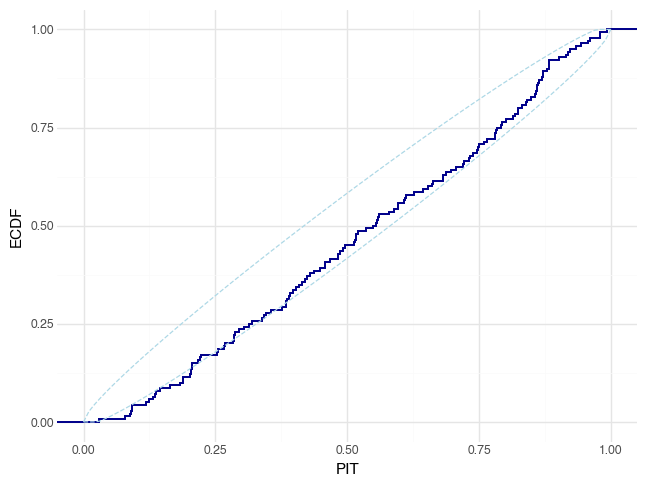

In [47]:
from utils import pp_check_pit_ecdf
pp_check_pit_ecdf(task5_idata)

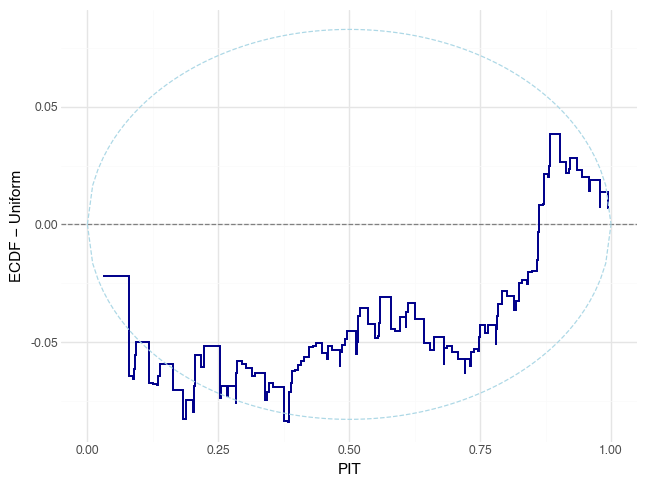

In [48]:
pp_check_pit_ecdf(task5_idata, plot_diff=True)

The fact that I cannot plot ETI and had to go with HDI is just ... UGH not fun ... 

In [111]:
# save fitted model 
task5_idata.to_netcdf(filename="../fitted_models/task5.x.nc")

'../fitted_models/task5.x.nc'

## Task 5 -- Error on Y-axis 

We have the following math model: 

$$
\begin{align*}
\texttt{y\_error}_i &\sim \mathcal{N}(\mu_{\text{PID}[i]}, \sigma_{i, \text{PID}[i]}) \\ 
\mu_j &\sim \mathcal{N}(\bar{\mu}, \sigma_\mu) \\ 
\log(\sigma_{i, j}) &= \alpha_j + \textcolor{red}{\log(\texttt{va.ans.x}_i)} \\ 
\alpha_j &\sim N(\mu_\alpha, \sigma_\alpha) \\ 
\mu_\alpha, \bar{\mu} &\sim N(0, 1) \\ 
\sigma_\alpha, \sigma_\mu &\sim \text{Half-Cauchy}(0, 1)
\end{align*}
$$

... which is exactly the same as the previous one, except for the red part. 

In [113]:
# prepare data 
# read in data again becasue this time we don't need to exclude 
# participants who answered things faulty on y 
task5_df = pl.read_csv("../../data/processed/task5.csv")
va_dist = task5_df.select("va.ans.x").to_numpy().flatten()
obv_error_y = (task5_df.select("va.select.y") - task5_df.select("va.ans.y")).to_numpy().flatten()

In [114]:
# create participant index mapping (for hierarchical modeling)
participant_ids = task5_df.select("participantId").to_numpy().flatten()
participant_idx, unique_participants = pd.factorize(participant_ids)

In [115]:
with pm.Model(coords={
    "participant": unique_participants
}) as task_5_y_model: 
    # hyperpriors 
    mu_bar = pm.Normal("mu_bar", 0, 1)
    mu_alpha = pm.Normal("mu_alpha", 0, 1)
    # sigma_bar = pm.HalfCauchy("sigma_bar", 1)
    # sigma_alpha = pm.HalfCauchy("sigma_alpha", 1)
    sigma_bar = pm.TruncatedNormal("sigma_bar", mu=0, sigma=1, lower=0)
    sigma_alpha = pm.TruncatedNormal("sigma_alpha", mu=0, sigma=1, lower=0)

    # data 
    va = pm.Data("va_dist", va_dist)
    participant_idx_data = pm.Data("participant_idx", participant_idx)

    # participant-level intercept 
    alpha = pm.Normal("alpha", mu_alpha, sigma_alpha, dims="participant")
    log_sigma = alpha[participant_idx_data] + pm.math.log(va)
    sigma = pm.math.exp(log_sigma)

    mu = pm.Normal("mu", mu_bar, sigma_bar, dims="participant")

    # likelihood 
    error = pm.Normal("error", mu[participant_idx_data], sigma, observed=obv_error_y)


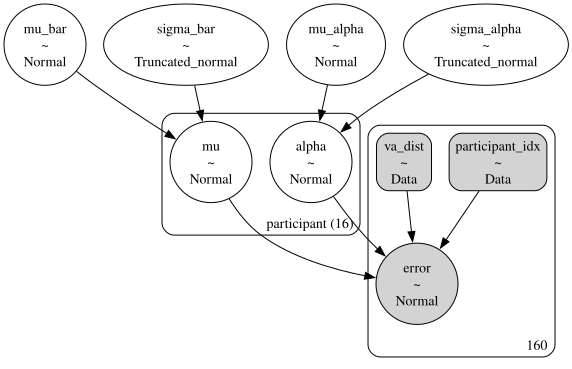

In [116]:
pm.model_to_graphviz(task_5_y_model)

In [117]:
# fit the model 
with task_5_y_model:
    task5_y_idata = pm.sample(
        draws=3000,
        tune=3000,
        target_accept=0.95,
        chains=4,
        cores=4,
        random_seed = 42, 
        progressbar=False
    )

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu_bar, mu_alpha, sigma_bar, sigma_alpha, alpha, mu]
Sampling 4 chains for 3_000 tune and 3_000 draw iterations (12_000 + 12_000 draws total) took 4 seconds.
There were 6 divergences after tuning. Increase `target_accept` or reparameterize.


:::{.callout-note}
# Note

I tried using Truncated Normal for the prior because the half-cauchy prior is giving me divergent transitions ... did not seem to solve the problem. 

Nevertheless, 6 divergences out of 3000 tune and 3000 draw iterations for 4 chains is a small amount of divergence. 
:::


In [118]:
az.summary(task5_y_idata)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
mu_bar,0.005,0.011,-0.017,0.026,0.000,0.000,15033.0,8695.0,1.0
mu_alpha,-4.635,0.105,-4.837,-4.439,0.001,0.001,8184.0,7670.0,1.0
alpha[67f03733938aa3f0d17ce8a8],-4.338,0.183,-4.663,-3.985,0.002,0.002,10282.0,7770.0,1.0
alpha[5c8f2ac8d7ecab0018d529aa],-4.842,0.214,-5.239,-4.449,0.002,0.002,11518.0,9199.0,1.0
alpha[6740e1e09ca406ab781318cb],-4.902,0.222,-5.327,-4.493,0.002,0.002,9832.0,8453.0,1.0
alpha[67e557aa25a43e8dde6c806c],-4.741,0.201,-5.119,-4.365,0.002,0.002,14290.0,8703.0,1.0
alpha[67f441842da280dba751a76b],-4.254,0.191,-4.617,-3.909,0.002,0.002,7664.0,8288.0,1.0
alpha[67f9736009c0ccdd5034f448],-4.746,0.199,-5.115,-4.378,0.002,0.002,15530.0,9242.0,1.0
alpha[67fbed03e8c70e38014c41b3],-4.693,0.196,-5.057,-4.322,0.002,0.002,13881.0,7914.0,1.0
alpha[558d8d71fdf99b534f79b352],-5.026,0.258,-5.512,-4.553,0.003,0.002,7500.0,9327.0,1.0


array([[<Axes: title={'center': 'mu_bar'}>,
        <Axes: title={'center': 'mu_bar'}>],
       [<Axes: title={'center': 'mu_alpha'}>,
        <Axes: title={'center': 'mu_alpha'}>],
       [<Axes: title={'center': 'alpha'}>, <Axes: title={'center': 'alpha'}>],
       [<Axes: title={'center': 'mu'}>, <Axes: title={'center': 'mu'}>],
       [<Axes: title={'center': 'sigma_bar'}>,
        <Axes: title={'center': 'sigma_bar'}>],
       [<Axes: title={'center': 'sigma_alpha'}>,
        <Axes: title={'center': 'sigma_alpha'}>]], dtype=object)

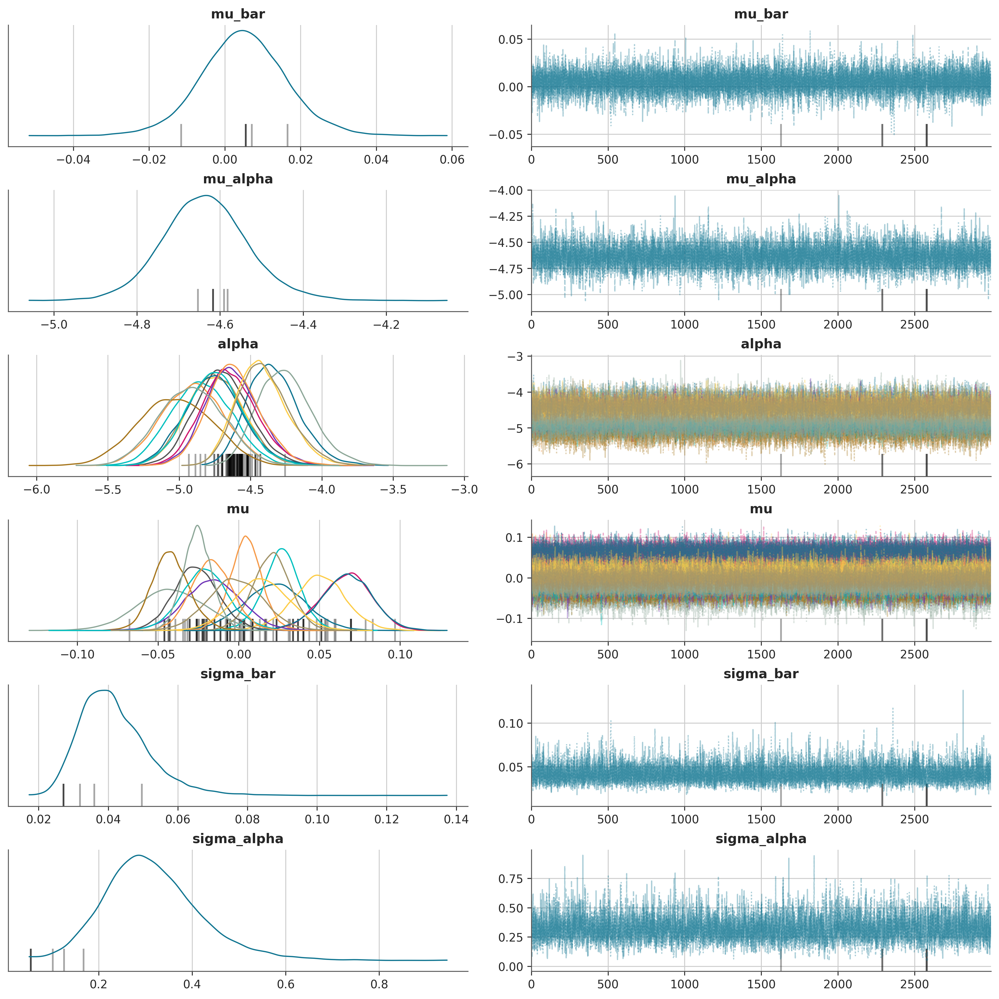

In [119]:
az.plot_trace(task5_y_idata, combined=True)

In [122]:
# posterior predictive check 
with task_5_y_model:
    task5_y_idata = pm.sample_posterior_predictive(task5_y_idata, extend_inferencedata=True)

Sampling: [error]


Sampling ... ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100% 0:00:00 / 0:00:00━━━━━━━  68% 0:00:01 / 0:00:00


array([<Axes: title={'center': '94.0% HDI'}>], dtype=object)

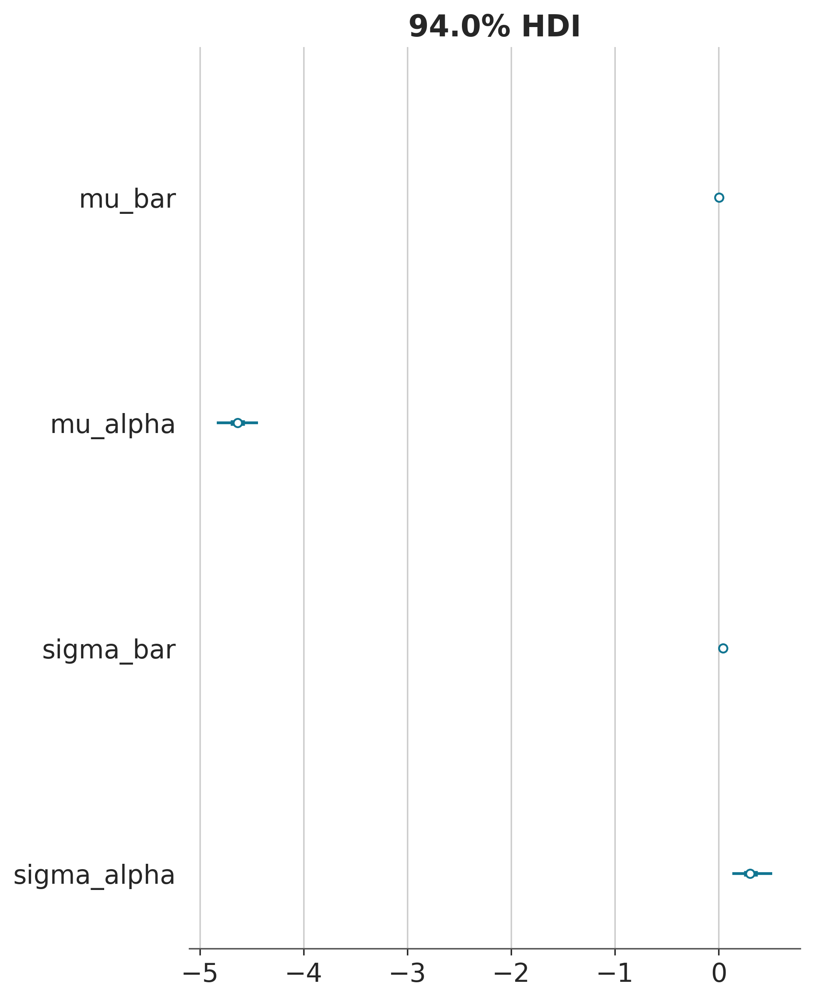

In [123]:
# az.plot_forest(task5_y_idata, combined=True)
az.plot_forest(task5_y_idata, combined=True, var_names=["mu_bar", "mu_alpha", "sigma_bar", "sigma_alpha"])

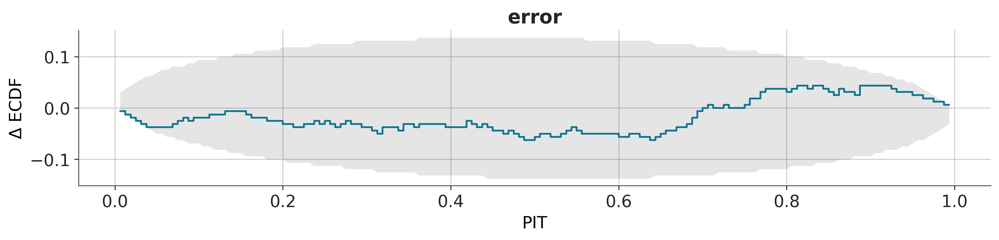

In [124]:
azp.plot_ppc_pit(task5_y_idata)

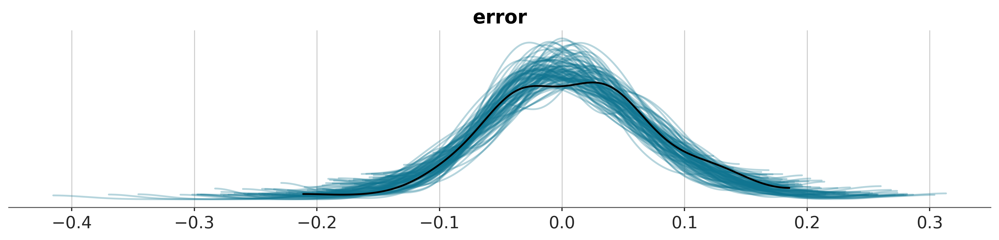

In [125]:
azp.plot_ppc_dist(
    task5_y_idata,
    num_samples=100,
)

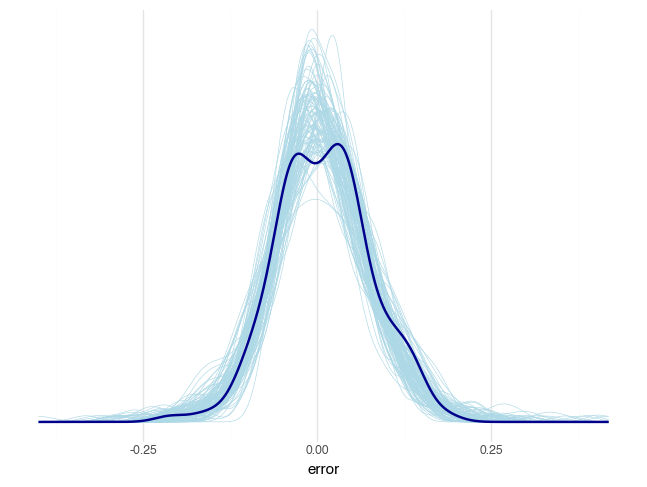

In [29]:
task5_y_idata = az.from_netcdf("../fitted_models/task5.y.nc")
pp_check_dens_overlay(task5_y_idata)

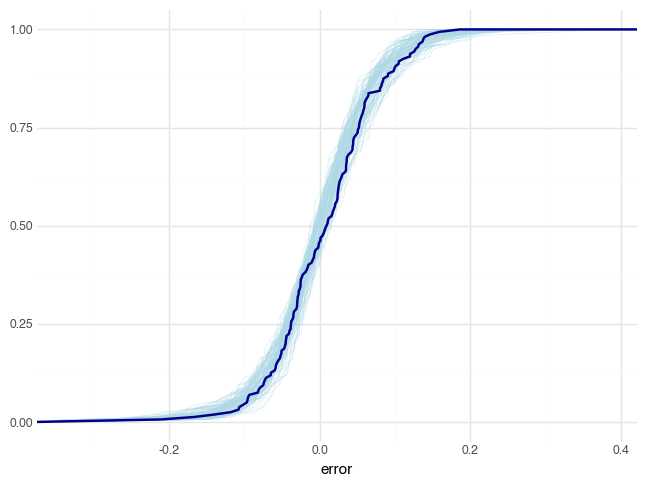

In [30]:
pp_check_ecdf_overlay(task5_y_idata)

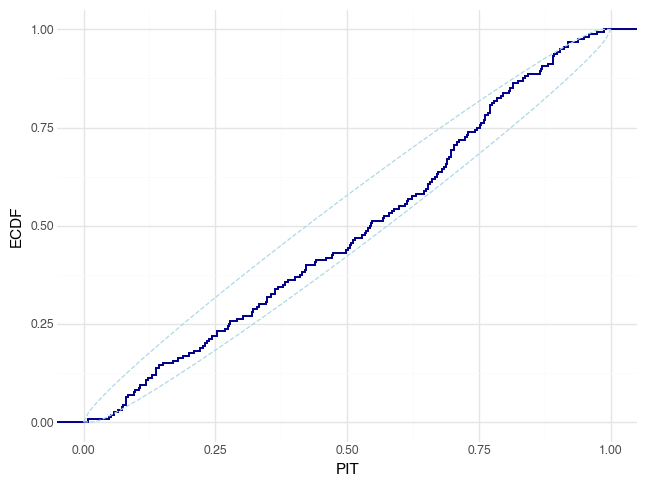

In [49]:
pp_check_pit_ecdf(task5_y_idata)

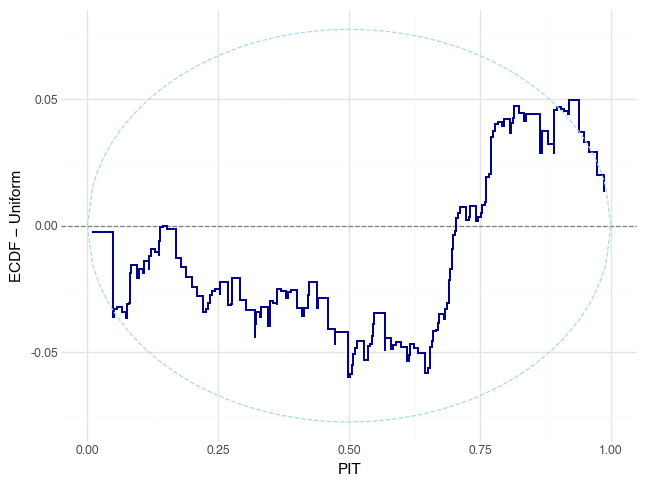

In [50]:
pp_check_pit_ecdf(task5_y_idata, plot_diff=True)

In [127]:
# save fitted model 
task5_y_idata.to_netcdf(filename="../fitted_models/task5.y.nc")

'../fitted_models/task5.y.nc'

## Task 3

Math model for task 3: 

$$
\begin{align*}
\texttt{error}_i &\sim \mathcal{N}(0, \sigma_{i, \text{PID}[i]}) \\ 
\log(\sigma_{i, j}) &= \alpha_j + \log(\texttt{va.ans.x}_i) \\ 
\alpha_j &\sim N(\mu_\alpha, \sigma_\alpha) \\ 
\mu_\alpha &\sim N(0, 1) \\ 
\sigma_\alpha &\sim \text{Half-Cauchy}(0, 1)
\end{align*}
$$

In [128]:
# prepare data 
error_va = (task3_df.select("va.select.y") - task3_df.select("va.ans.y")).to_numpy().flatten()
va_dist = task3_df.select("va.ans.x").to_numpy().flatten()

In [129]:
# create participant index mapping (for hierarchical modeling)
participant_ids = task3_df.select("participantId").to_numpy().flatten()
participant_idx, unique_participants = pd.factorize(participant_ids)

In [130]:
with pm.Model(coords={
    "participant": unique_participants
}) as task_3_model:
    # hyperpriors 
    sigma_alpha = pm.HalfCauchy("sigma_alpha", 1)
    mu_alpha = pm.Normal("mu_alpha", 0, 1)

    # participant-level intercept 
    alpha = pm.Normal("alpha", mu_alpha, sigma_alpha, dims="participant")
    
    # observation level variance 
    va = pm.Data("vis_angle", va_dist)
    log_sigma = alpha[participant_idx] + pm.math.log(va)
    sigma = pm.math.exp(log_sigma)

    # likelihood 
    error = pm.Normal("error", 0, sigma, observed=error_va)

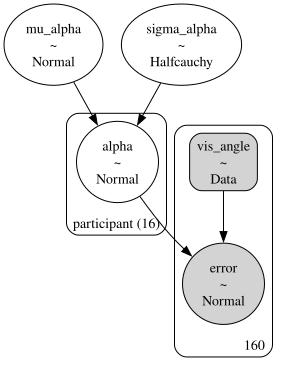

In [131]:
# check to verify that this is the model that we want 
# task_3_model
pm.model_to_graphviz(task_3_model)

In [132]:
# fit the model 
with task_3_model:
    task_3_trace = pm.sample(
        draws=3000,
        tune=3000,
        chains=4,
        cores=4,
        random_seed = 42, 
        progressbar=False
    )

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma_alpha, mu_alpha, alpha]
Sampling 4 chains for 3_000 tune and 3_000 draw iterations (12_000 + 12_000 draws total) took 2 seconds.


In [66]:
az.summary(task_3_trace)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
mu_alpha,-4.206,0.137,-4.451,-3.938,0.001,0.001,14773.0,9429.0,1.0
alpha[67f03733938aa3f0d17ce8a8],-4.135,0.205,-4.509,-3.739,0.001,0.002,22266.0,9522.0,1.0
alpha[5c8f2ac8d7ecab0018d529aa],-3.775,0.195,-4.133,-3.411,0.001,0.002,19144.0,8495.0,1.0
alpha[6740e1e09ca406ab781318cb],-4.499,0.217,-4.898,-4.090,0.002,0.002,21350.0,8824.0,1.0
alpha[67e557aa25a43e8dde6c806c],-4.417,0.213,-4.823,-4.021,0.001,0.002,21688.0,8451.0,1.0
alpha[67f441842da280dba751a76b],-3.856,0.196,-4.206,-3.484,0.001,0.002,20177.0,9340.0,1.0
alpha[67f9736009c0ccdd5034f448],-4.144,0.204,-4.520,-3.759,0.001,0.002,23009.0,9280.0,1.0
alpha[67fbed03e8c70e38014c41b3],-4.119,0.201,-4.488,-3.738,0.001,0.002,22401.0,8486.0,1.0
alpha[558d8d71fdf99b534f79b352],-4.614,0.230,-5.043,-4.187,0.002,0.002,21302.0,8985.0,1.0
alpha[667433338e6cc9e53c828774],-4.366,0.214,-4.751,-3.958,0.001,0.002,23720.0,8858.0,1.0


array([[<Axes: title={'center': 'mu_alpha'}>,
        <Axes: title={'center': 'mu_alpha'}>],
       [<Axes: title={'center': 'alpha'}>, <Axes: title={'center': 'alpha'}>],
       [<Axes: title={'center': 'sigma_alpha'}>,
        <Axes: title={'center': 'sigma_alpha'}>]], dtype=object)

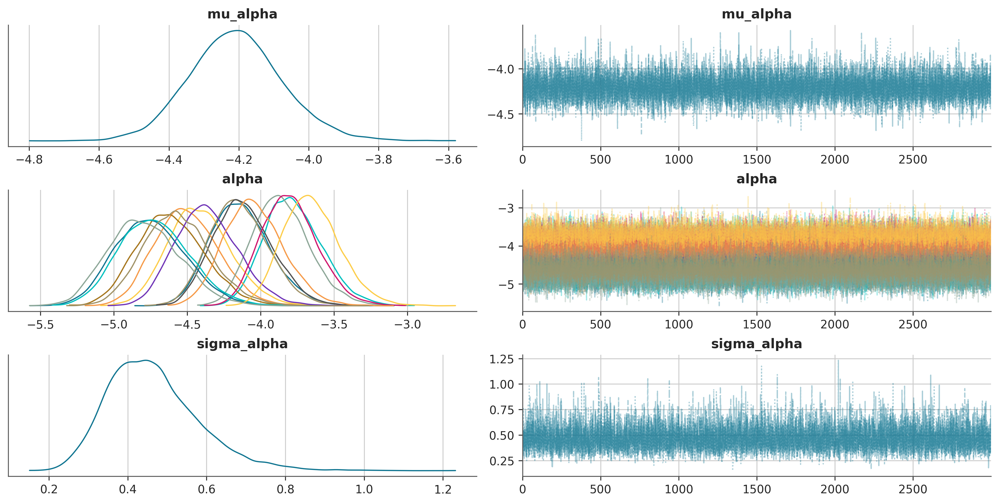

In [133]:
az.plot_trace(task_3_trace, combined=True)

### Posterior predictive checks 

In [134]:
# posterior predictive check 
with task_3_model:
    task_3_trace = pm.sample_posterior_predictive(task_3_trace, extend_inferencedata=True, random_seed=42)

Sampling: [error]


Sampling ... ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100% 0:00:00 / 0:00:005;237m━  95% 0:00:01 / 0:00:00


We will plot using the [`plot_ppc_dist`](https://python.arviz.org/projects/plots/en/latest/api/generated/arviz_plots.plot_ppc_dist.html#arviz_plots.plot_ppc_dist) function: 

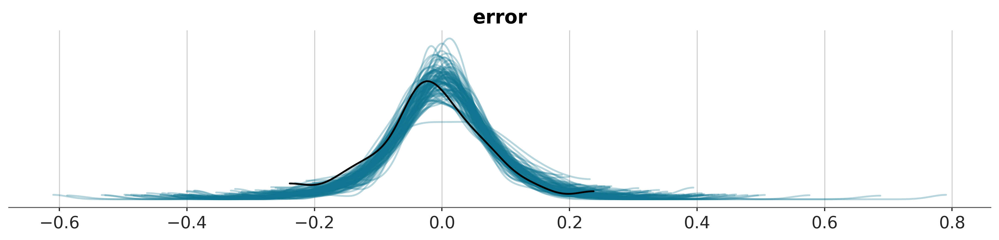

In [135]:
pc = azp.plot_ppc_dist(
    task_3_trace,
    num_samples=100,
)
pc.show()

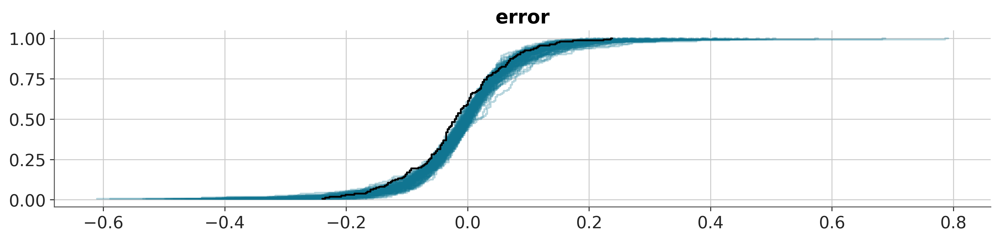

In [136]:
pc = azp.plot_ppc_dist(
    task_3_trace,
    num_samples=100,
    backend="matplotlib",
    kind="ecdf"
)
pc.show()

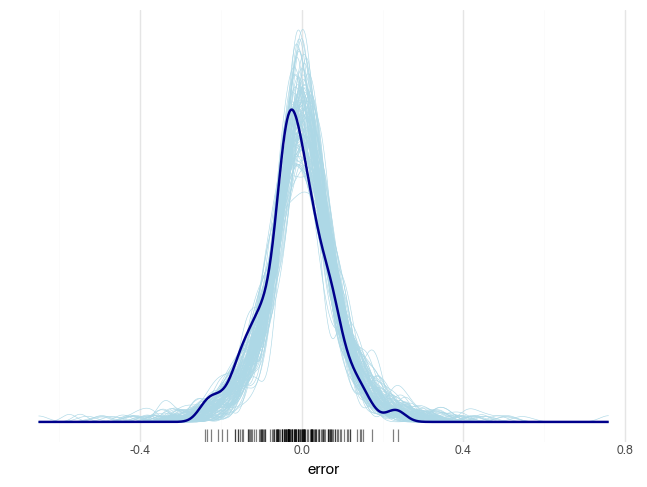

In [33]:
task_3_trace = az.from_netcdf("../fitted_models/task3.nc")
pp_check_dens_overlay(task_3_trace, num_samples=100, rug_on=True)

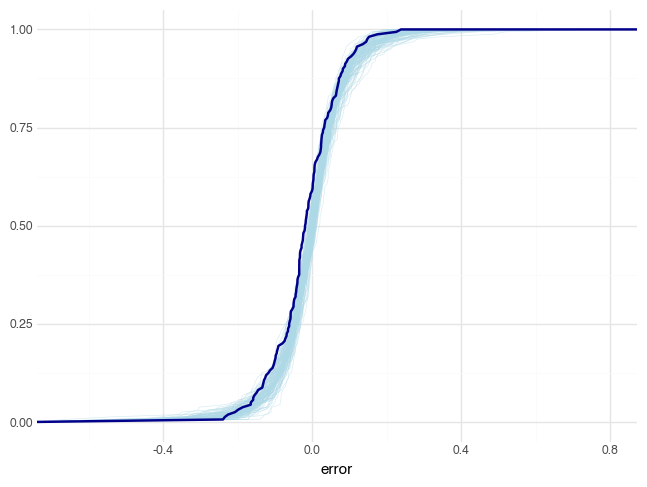

In [34]:
pp_check_ecdf_overlay(task_3_trace)

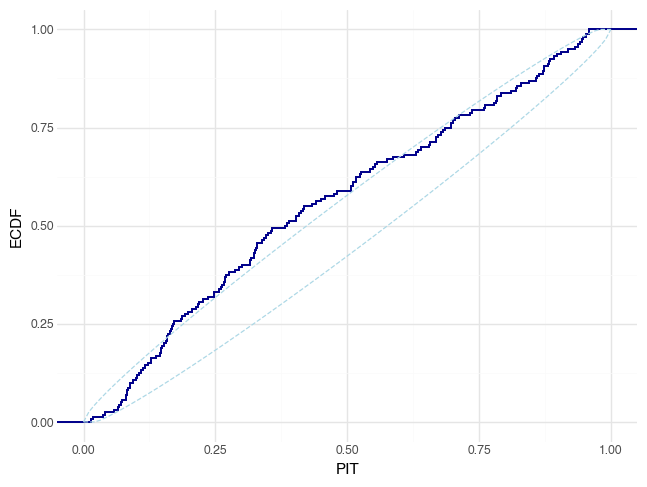

In [51]:
pp_check_pit_ecdf(task_3_trace)

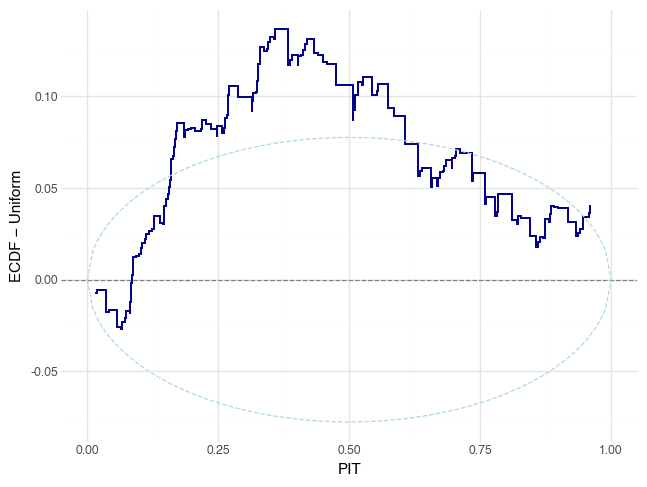

In [52]:
pp_check_pit_ecdf(task_3_trace, plot_diff=True)

Comparing this to the posterior predictive check generated by `bayesplot` in `R`, the one in `R` seems to have an extended long line ...? WHY?? 

Next we plot the **pit_ecdf** plot: 

(See more information in this [documentation](https://arviz-devs.github.io/EABM/Chapters/Prior_posterior_predictive_checks.html#pit-ecdfs) for posterior and prior predictive checks)

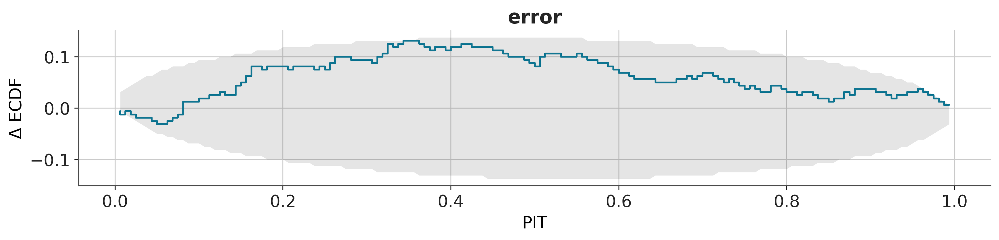

In [ ]:
pc = azp.plot_ppc_pit(
    task_3_trace,
)
pc.show()

What I don't get is that, why is it plotting Delta ECDF and not just plain ECDF ...?? 

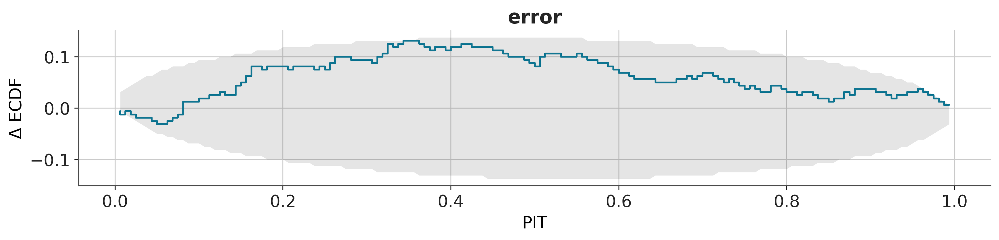

In [ ]:
pc = azp.plot_ppc_pit(
    task_3_trace,
)
pc.show()

In [140]:
# save the fitted model 

task_3_trace.to_netcdf(filename="../fitted_models/task3.nc")

'../fitted_models/task3.nc'